# 多头注意力权重

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import mne
import torch
import scipy.io as scio

In [2]:
def normalize(data):
    min_val = min(data)
    max_val = max(data)
    normalized = [2 * (x - min_val) / (max_val - min_val + 0.000001) - 1 for x in data]
    return normalized

def norminy_channel(data):
    for j in range(5):
        data[j, :] = normalize(data[j, :])
    return data
def norminy_band(data):
    for j in range(5):
        data[:, j] = normalize(data[:, j])
    return data
def norminy_band2(data):
    for j in range(62):
        data[j, :] = normalize(data[j, :])
    return data

In [3]:
ch_pos = {
    'FP1': (-0.0307, 0.0949, -0.0047), 'FPZ': (0.0000, 0.0999, -0.0021), 'FP2': (0.0307, 0.0949, -0.0047),
    'AF3': (-0.0370, 0.0895, 0.0245), 'AF4': (0.0370, 0.0895, 0.0245),
    'F7': (-0.0804, 0.0586, -0.0088), 'F5': (-0.0741, 0.0635, 0.0213),
    'F3': (-0.0567, 0.0677, 0.0469), 'F1': (-0.0306, 0.0704, 0.0639),
    'FZ': (0.0000, 0.0714, 0.0699), 'F2': (0.0306, 0.0704, 0.0640),
    'F4': (0.0566, 0.0677, 0.0469), 'F6': (0.0741, 0.0635, 0.0214),
    'F8': (0.0804, 0.0587, -0.0088),
    'FT7': (-0.0945, 0.0308, -0.0100), 'FC5': (-0.0896, 0.0338, 0.0284),
    'FC3': (-0.0697, 0.0364, 0.0617), 'FC1': (-0.0380, 0.0381, 0.0841),
    'FCZ': (0.0000, 0.0387, 0.0921), 'FC2': (0.0380, 0.0381, 0.0841),
    'FC4': (0.0697, 0.0364, 0.0617), 'FC6': (0.0896, 0.0338, 0.0284),
    'FT8': (0.0945, 0.0308, -0.0100),
    'T7': (-0.0994, 0.0000, -0.0104), 'C5': (-0.0950, 0.0000, 0.0309),
    'C3': (-0.0742, 0.0000, 0.0668), 'C1': (-0.0406, -0.0000, 0.0913),
    'CZ': (0.0000, 0.0000, 0.1000), 'C2': (0.0407, 0.0000, 0.0913),
    'C4': (0.0743, 0.0000, 0.0669), 'C6': (0.0950, 0.0000, 0.0309),
    'T8': (0.0994, 0.0000, -0.0104),
    'TP7': (-0.0945, -0.0308, -0.0100), 'CP5': (-0.0896, -0.0338, 0.0284),
    'CP3': (-0.0697, -0.0364, 0.0617), 'CP1': (-0.0380, -0.0381, 0.0841),
    'CPZ': (0.0000, -0.0387, 0.0921), 'CP2': (0.0380, -0.0381, 0.0841),
    'CP4': (0.0697, -0.0364, 0.0617), 'CP6': (0.0896, -0.0338, 0.0284),
    'TP8': (0.0945, -0.0309, -0.0100),
    'P7': (-0.0804, -0.0586, -0.0088), 'P5': (-0.0741, -0.0635, 0.0213),
    'P3': (-0.0567, -0.0677, 0.0469), 'P1': (-0.0306, -0.0704, 0.0639),
    'PZ': (0.0000, -0.0714, 0.0699), 'P2': (0.0306, -0.0704, 0.0640),
    'P4': (0.0566, -0.0677, 0.0469), 'P6': (0.0741, -0.0635, 0.0214),
    'P8': (0.0804, -0.0587, -0.0088),
    'PO7': (-0.0584, -0.0807, -0.0070), 'PO5': (-0.0505, -0.0856, 0.0105),
    'PO3': (-0.0370, -0.0895, 0.0245), 'POZ': (0.0000, -0.0929, 0.0368),
    'PO4': (0.0370, -0.0895, 0.0245), 'PO6': (0.0505, -0.0856, 0.0105),
    'PO8': (0.0584, -0.0808, -0.0070),
    'CB1': (-0.0451, -0.0890, -0.0059), 'O1': (-0.0307, -0.0949, -0.0047),
    'OZ': (0.0000, -0.0999, -0.0021), 'O2': (0.0307, -0.0949, -0.0047),
    'CB2': (0.0451, -0.0890, -0.0059)
}

# 3、创建自定义蒙太奇
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame='head')

# 查看脑地形图矩阵导联位置
sensor_data = montage.get_positions()['ch_pos']
sensor_dataframe = pd.DataFrame(sensor_data).T
chLa_index = sensor_dataframe.index.values

In [4]:
seed_ch_names = [
    'FP1', 'FPZ', 'FP2', 'AF3', 'AF4', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8',
    'FT7', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'FT8', 'T7', 'C5', 'C3', 'C1',
    'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6',
    'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POZ',
    'PO4', 'PO6', 'PO8', 'CB1', 'O1', 'OZ', 'O2', 'CB2'
]

In [117]:
# s1_weights_attention_pth = '0_weights.npy'
s1_weights_attention_pth = r"E:\EEG\code\PHD_Project\MSADS\model\msda_plotseed4_cross_subject\model_csub_1\1_tgt_weights.npy"
weights_s1 = np.load(s1_weights_attention_pth, allow_pickle=True)

In [118]:
weights_s1_band, weights_s1_channels = weights_s1[0].detach().cpu().numpy(), weights_s1[1].detach().cpu().numpy()

In [106]:
weights_s1_band1 = norminy_band2(weights_s1_band[0].mean(axis=-1))
weights_s1_channels1 = norminy_channel(weights_s1_channels[0].mean(axis=-1))

In [123]:
weights_s1_band2 = weights_s1_band1.mean(axis=-1)
weights_s1_channels2 = weights_s1_channels1.mean(axis=0)

In [121]:
weights_s1_band2

array([ 5.99964023e-01,  1.99986517e-01, -6.00009024e-01,  3.99984270e-01,
       -2.00018004e-01,  5.99964023e-01,  5.99964023e-01, -2.00018018e-01,
       -2.00018004e-01, -6.00009024e-01,  1.99972734e-01, -6.00009024e-01,
       -2.00018004e-01, -2.00018004e-01, -1.12352745e-05,  3.33323389e-01,
        1.99973017e-01,  1.99972987e-01,  5.99964023e-01,  5.99964023e-01,
        5.99964023e-01, -2.00018018e-01,  5.99982023e-01,  5.99964023e-01,
        5.99964023e-01,  1.99973017e-01,  3.99984121e-01,  1.99973002e-01,
        5.99964023e-01,  5.99982023e-01, -2.00008988e-01,  1.99986532e-01,
        3.99984270e-01,  1.99986488e-01, -2.00018004e-01,  3.99984270e-01,
        3.99984270e-01,  1.99973017e-01, -1.00000000e+00,  5.99964023e-01,
        5.99964023e-01,  5.99964023e-01,  5.99964023e-01,  3.33323389e-01,
       -1.00000000e+00,  1.99973002e-01,  5.99964023e-01,  1.99973017e-01,
       -2.00018018e-01,  1.99973002e-01,  1.99972987e-01,  1.99973002e-01,
        1.99972987e-01, -

## 绘制通道加权图

In [108]:
# 权重
# seed4_weight_delta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[0])}
# seed4_weight_theta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[1])}
# seed4_weight_alpha = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[2])}
# seed4_weight_beta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[3])}
# seed4_weight_gamma = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[4])}

seed4_weight_delta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,0])}
seed4_weight_theta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,1])}
seed4_weight_alpha = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,2])}
seed4_weight_beta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,3])}
seed4_weight_gamma = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,4])}
# seed_weight_delta = dict(zip(seed_ch_names, seed4_weight_delta))
# seed_weight_theta = dict(zip(seed_ch_names, seed4_weight_theta))
# seed_weight_alpha = dict(zip(seed_ch_names, seed4_weight_alpha))
# seed_weight_beta  = dict(zip(seed_ch_names, seed4_weight_beta))
# seed_weight_gamma = dict(zip(seed_ch_names, seed4_weight_gamma))
# seed4_weight_gamma = {ch: weight for ch, weight in zip(seed_ch_names, src_CFE_bands.sum(axis=0))}

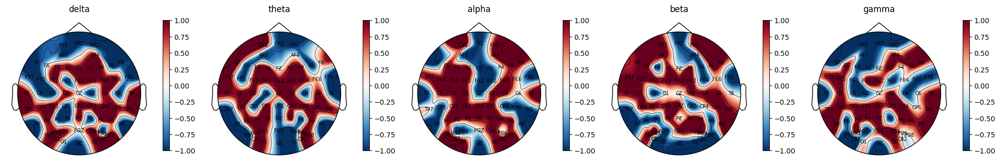

In [ ]:
seed4_weight_delta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[0])}
seed4_weight_theta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[1])}
seed4_weight_alpha = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[2])}
seed4_weight_beta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[3])}
seed4_weight_gamma = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[4])}
bands = ['delta', 'theta', 'alpha', 'beta', 'gamma']
weight_dicts = [seed4_weight_delta, seed4_weight_theta, seed4_weight_alpha,
                seed4_weight_beta, seed4_weight_gamma]
# 8. 创建 Info 并设置蒙太奇
info = mne.create_info(
    ch_names=list(chLa_index),
    ch_types=['eeg'] * len(chLa_index),
    sfreq=1000
)
info.set_montage(montage)

# 9. 在同一画布上绘制 5 个频段的拓扑图
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for ax, band, wdict in zip(axes, bands, weight_dicts):
    reWeight = [wdict[ch] for ch in chLa_index]
    im, _ = mne.viz.plot_topomap(
        reWeight, info, axes=ax, show=False,
        names=list(chLa_index), sphere=0.125
    )
    fig.colorbar(im, ax=ax, shrink=0.7)
    ax.set_title(band, fontsize=12)



plt.tight_layout()
# fig.subplots_adjust(right=0.9)
plt.savefig('Figure_s2_band2.pdf', dpi=300, bbox_inches='tight')
plt.savefig('Figure_s2_band2.svg', dpi=300, bbox_inches='tight')
# plt.show()

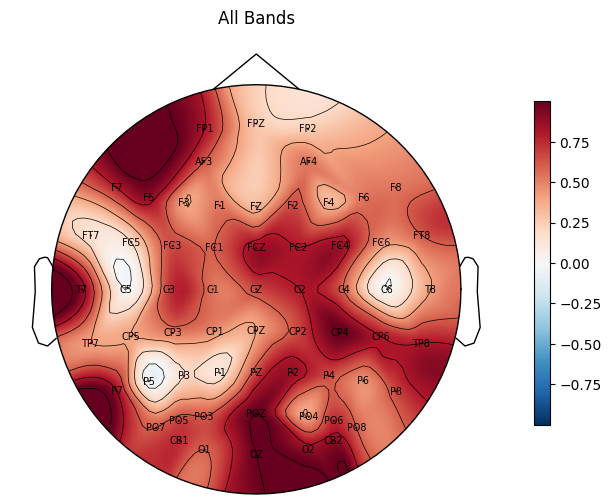

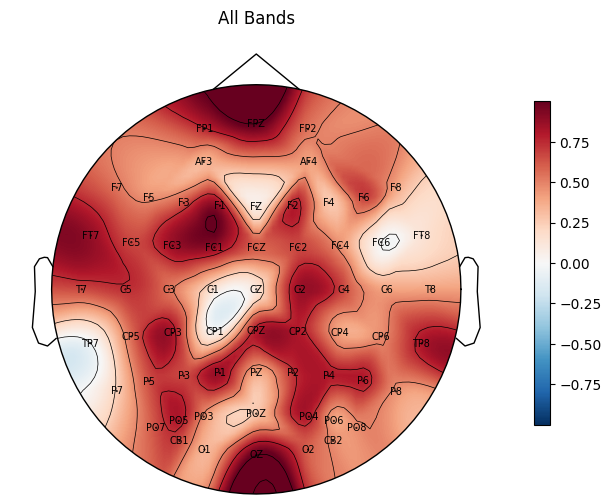

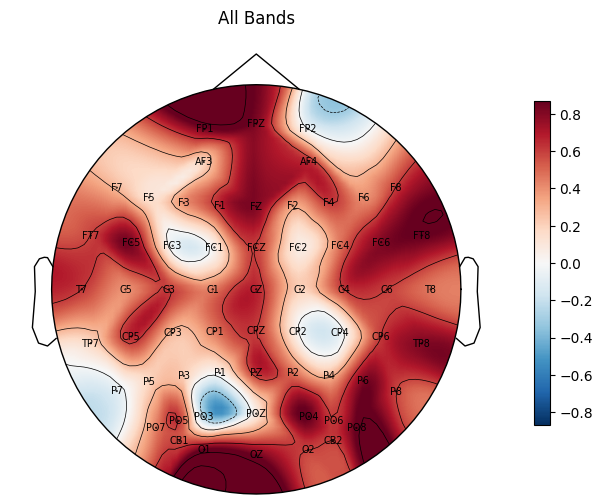

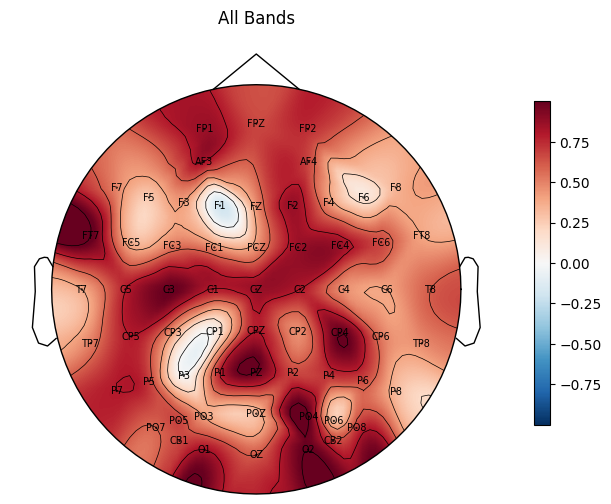

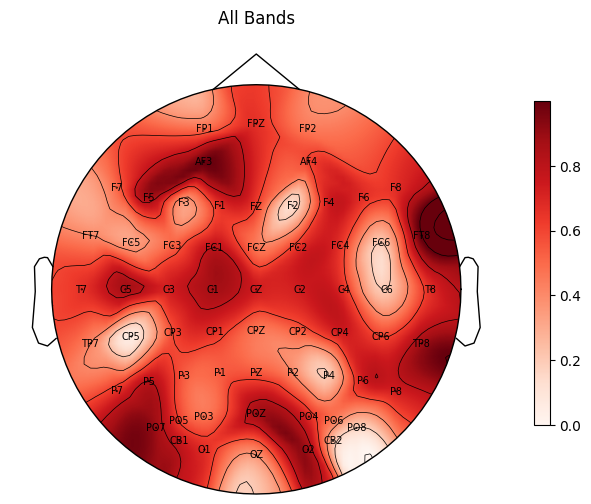

...

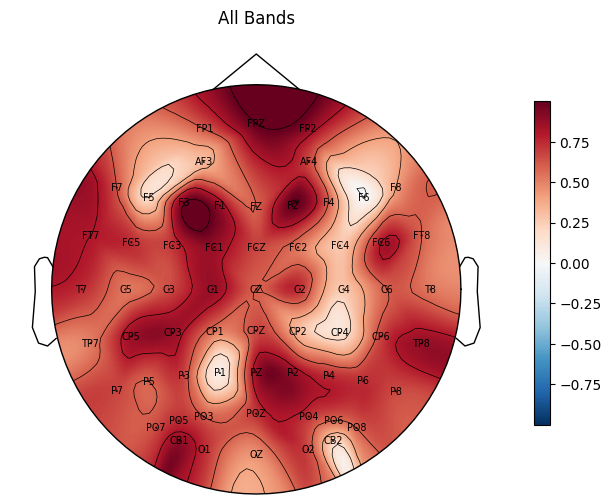

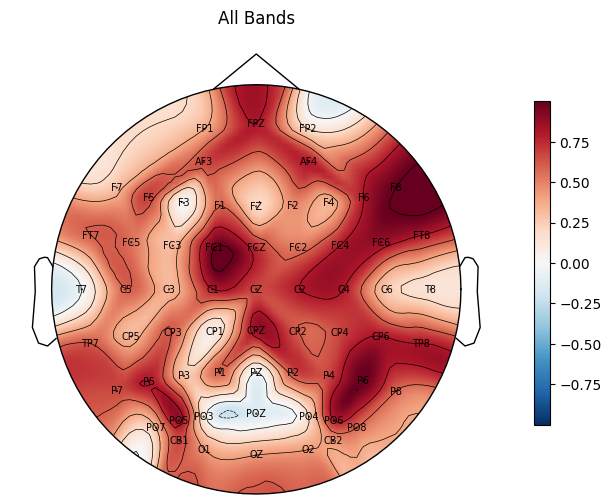

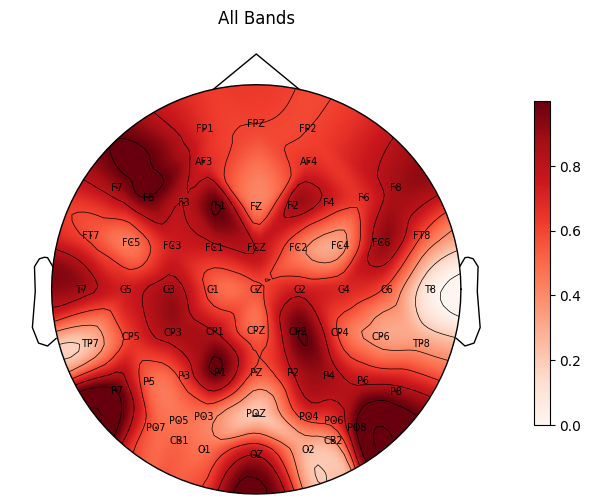

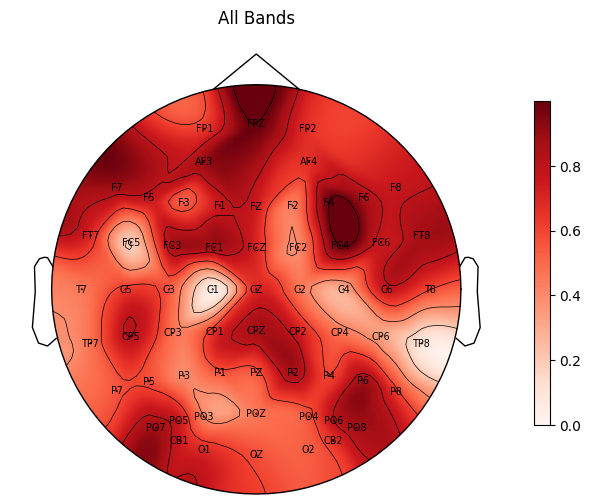

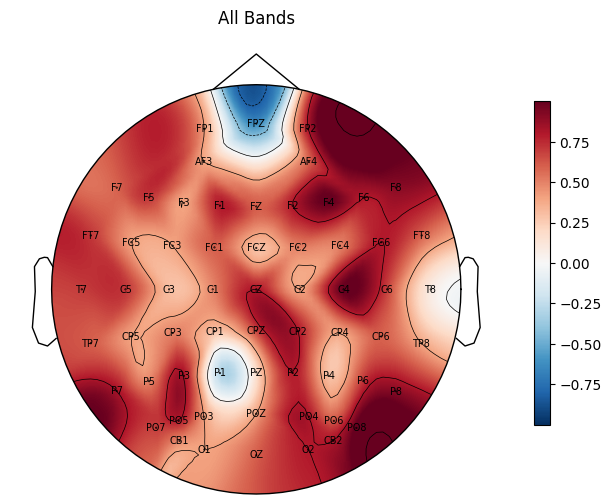

In [197]:
for i in range(15):
    weights_s1 = np.load(f"E:\\EEG\\code\\PHD_Project\\MSADS\\model\\msda_plotseed4_cross_subject\\model_csub_1\\{i}_tgt_weights.npy",
                          allow_pickle=True)
    weights_s1_band, weights_s1_channels = weights_s1[0].detach().cpu().numpy(), weights_s1[1].detach().cpu().numpy()
    weights_s1_band1 = norminy_band(weights_s1_band[0].mean(axis=-1))
    weights_s1_channels1 = norminy_channel(weights_s1_channels[0].mean(axis=-1))
    weights_s1_band2 = weights_s1_band1.mean(axis=-1)
    # weights_s1_channels2 = weights_s1_channels1.sum(axis=0)
    weights_s1_band_all = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band2)}
    reWeight = [weights_s1_band_all[ch] for ch in chLa_index]

    # 6. 创建 Info 并设置蒙太奇
    info = mne.create_info(
        ch_names=list(chLa_index),
        ch_types=['eeg'] * len(chLa_index),
        sfreq=1000
    )
    info.set_montage(montage)

    # 7. 绘制权重拓扑图（修复 colorbar 警告）
    fig2, ax = plt.subplots(figsize=(8, 6))  # 创建画布
    # import pdb;pdb.set_trace()
    im, cn = mne.viz.plot_topomap(
        reWeight,
        info,
        axes=ax,
        show=False,
        names=list(chLa_index),
        sphere=0.125
    )
    fig2.colorbar(im, ax=ax, shrink=0.7)
    ax.set_title('All Bands', fontsize=12)
    plt.savefig(f'Figure_s{i+1}_ball.pdf', dpi=300, bbox_inches='tight')
    plt.savefig(f'Figure_s{i+1}_ball.svg', dpi=300, bbox_inches='tight')
    plt.show()

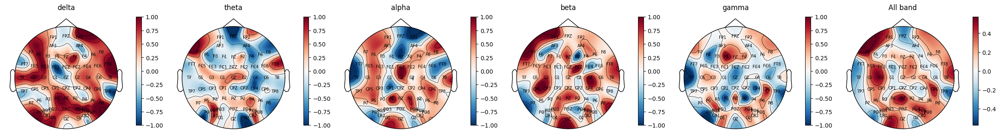

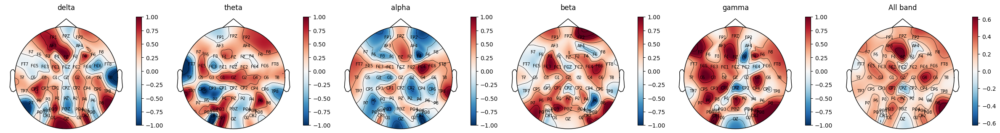

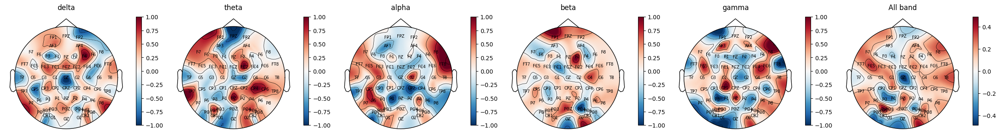

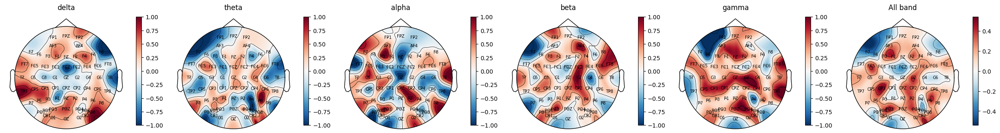

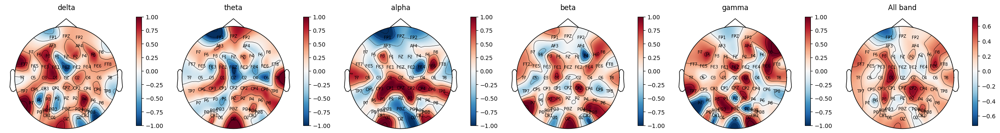

...

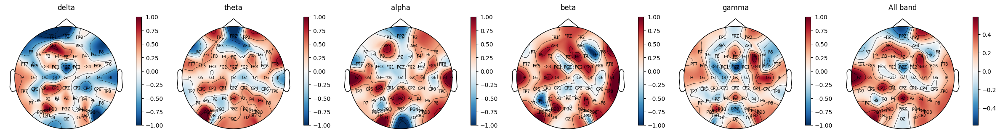

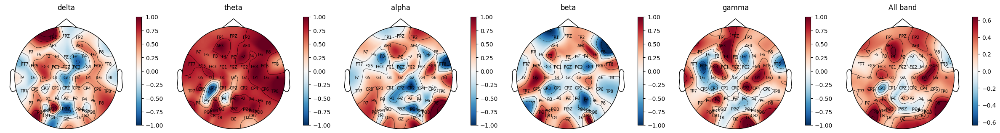

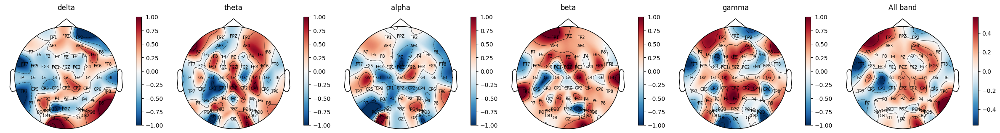

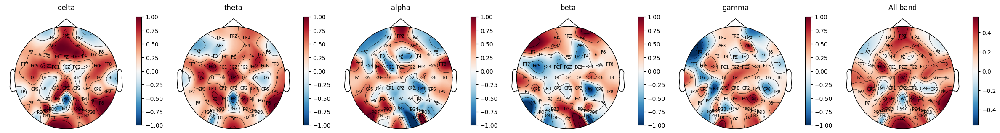

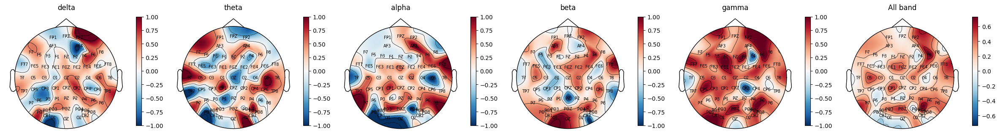

In [ ]:
# all_subject = []
for i in range(15):
    # s1_weights_attention_pth = '0_weights.npy'
    # s1_weights_attention_pth = "E:\\EEG\\code\\PHD_Project\\MSADS\\model\\msda_plotseed4_cross_subject\\model_csub_1"
    weights_s1 = np.load(f"E:\\EEG\\code\\PHD_Project\\MSADS\\model\\msda_plotseed4_cross_subject\\model_csub_1\\{i}_tgt_weights.npy",
                          allow_pickle=True)
    weights_s1_band, weights_s1_channels = weights_s1[0].detach().cpu().numpy(), weights_s1[1].detach().cpu().numpy()
    # weights_s1_band1 = norminy_band(weights_s1_band[0].mean(axis=-1))
    # weights_s1_band1 = (weights_s1_band[0].mean(axis=-1))
    # all_subject.append(weights_s1_band1.mean(axis=0))

    weights_s1_channels1 = norminy_channel(weights_s1_channels[0].mean(axis=-1))
    # weights_s1_band2 = weights_s1_band1.mean(axis=-1)
    weights_s1_channels2 = weights_s1_channels1.mean(axis=0)
    seed4_weight_delta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[0])}
    seed4_weight_theta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[1])}
    seed4_weight_alpha = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[2])}
    seed4_weight_beta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[3])}
    seed4_weight_gamma = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels1[4])}
    seed4_weight_allband = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels2)}
    # seed4_weight_delta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,0])}
    # seed4_weight_theta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,1])}
    # seed4_weight_alpha = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,2])}
    # seed4_weight_beta = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,3])}
    # seed4_weight_gamma = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band1[:,4])}
    # seed4_weight_allband = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_band2)}
    bands = ['delta', 'theta', 'alpha', 'beta', 'gamma', 'All band']
    weight_dicts = [seed4_weight_delta, seed4_weight_theta, seed4_weight_alpha,
                    seed4_weight_beta, seed4_weight_gamma, seed4_weight_allband]
    # 8. 创建 Info 并设置蒙太奇
    info = mne.create_info(
        ch_names=list(chLa_index),
        ch_types=['eeg'] * len(chLa_index),
        sfreq=1000
    )
    info.set_montage(montage)

    # 9. 在同一画布上绘制 5 个频段的拓扑图
    fig, axes = plt.subplots(1, 6, figsize=(24, 4))
    for ax, band, wdict in zip(axes, bands, weight_dicts):
        reWeight = [wdict[ch] for ch in chLa_index]
        im, _ = mne.viz.plot_topomap(
            reWeight, info, axes=ax, show=False,
            names=list(chLa_index), sphere=0.125
        )
        fig.colorbar(im, ax=ax, shrink=0.7)
        ax.set_title(band, fontsize=12)

    plt.tight_layout()
    # fig.subplots_adjust(right=0.9)
    plt.savefig(f'./fig7_8/Figure_s{i+1}_channel.pdf', dpi=300, bbox_inches='tight')
    plt.savefig(f'./fig7_8/Figure_s{i+1}_channel.svg', dpi=300, bbox_inches='tight')
# all_subject = np.array(all_subject)

### 通道注意力所有受试者

In [220]:
# all_subject = []
weight_dicts = []
subject = []
for i in range(15):
    # s1_weights_attention_pth = '0_weights.npy'
    # s1_weights_attention_pth = "E:\\EEG\\code\\PHD_Project\\MSADS\\model\\msda_plotseed4_cross_subject\\model_csub_1"
    weights_s1 = np.load(f"E:\\EEG\\code\\PHD_Project\\MSADS\\model\\msda_plotseed4_cross_subject\\model_csub_1\\{i}_tgt_weights.npy",
                          allow_pickle=True)
    weights_s1_band, weights_s1_channels = weights_s1[0].detach().cpu().numpy(), weights_s1[1].detach().cpu().numpy()
    # weights_s1_band1 = norminy_band(weights_s1_band[0].mean(axis=-1))
    # weights_s1_band1 = (weights_s1_band[0].mean(axis=-1))
    # all_subject.append(weights_s1_band1.mean(axis=0))
    weights_s1_channels1 = norminy_channel(weights_s1_channels[0].mean(axis=-1))
    # weights_s1_band2 = weights_s1_band1.mean(axis=-1)
    weights_s1_channels2 = weights_s1_channels1.mean(axis=0)
    seed4_weight_allband = {ch: weight for ch, weight in zip(seed_ch_names, weights_s1_channels2)}
    subject.append('Subject ' + str(i+1))
    weight_dicts.append(seed4_weight_allband)


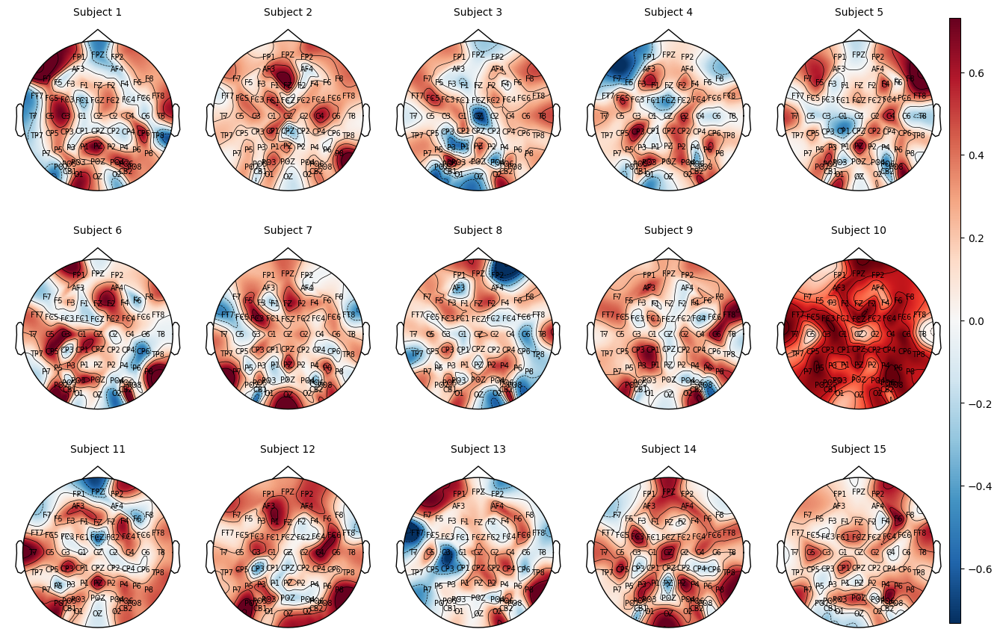

In [228]:
# 创建 Info 并设置蒙太奇
info = mne.create_info(
    ch_names=list(chLa_index),
    ch_types=['eeg'] * len(chLa_index),
    sfreq=1000
)
info.set_montage(montage)

# 计算全局颜色范围（vmin和vmax）
all_weights = []
for wdict in weight_dicts:
    reWeight = [wdict[ch] for ch in chLa_index]
    all_weights.extend(reWeight)
vmin, vmax = np.min(all_weights), np.max(all_weights)

# 创建画布和子图
fig, axes = plt.subplots(3, 5, figsize=(15, 9))  # 调整画布高度以适应colorbar
axes_flat = axes.flatten()  # 将子图展平为一维数组

# 遍历所有子图和数据
for ax, band, wdict in zip(axes_flat, subject, weight_dicts):
    reWeight = [wdict[ch] for ch in chLa_index]
    im, _ = mne.viz.plot_topomap(
        reWeight, 
        info, 
        axes=ax, 
        show=False,
        names=list(chLa_index), 
        sphere=0.125,
    )
    ax.set_title(band, fontsize=10)

# 调整布局并添加共用colorbar
plt.tight_layout()
# 在右侧预留空间给colorbar
fig.subplots_adjust(right=0.85)
# 定义colorbar的位置 [左, 下, 宽, 高]
cax = fig.add_axes([0.85, 0.05, 0.01, 0.9])
fig.colorbar(im, cax=cax)

# 保存图像
plt.savefig(f'./fig7_8/Figure_channel.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'./fig7_8/Figure_channel.svg', dpi=300, bbox_inches='tight')
plt.show()

## T-SNE

In [5]:
from sklearn.manifold import TSNE

In [130]:
# s1_weights_attention_pth = '0_weights.npy'
# s1_feature_pth = r"E:\EEG\code\PHD_Project\MSADS\model\msda_plotseed4_cross_subject\model_csub_1\0_tgt_feature.npy"
# feature_s1 = np.load(s1_feature_pth, allow_pickle=True).item()
CFE_feture_all = []
DSFE_feture_all = []
raw_data_all = []
label_all = []
for i in range(12, 13):
    feature_s1 = np.load(f"E:\\EEG\\code\\PHD_Project\\MSADS\\model\\msda_plotseed4_cross_subject\\model_csub_1\\{i}_tgt_feature.npy",
                         allow_pickle=True).item()
    raw_data = feature_s1['raw_data'].detach().cpu().numpy()
    CFE_feature = feature_s1['CFE_feature'].detach().cpu().numpy()
    DSFE_feature = feature_s1['DSFE_feature'].detach().cpu().numpy()
    label_s1 = feature_s1['ture_label'].detach().cpu().numpy()
    CFE_feture_all.append(CFE_feature)
    raw_data_all.append(raw_data)
    DSFE_feture_all.append(DSFE_feature)
    label_all.append(label_s1)
CFE_feture_all = np.concatenate(CFE_feture_all, axis=0)
DSFE_feture_all = np.concatenate(DSFE_feture_all, axis=0)
raw_data_all = np.concatenate(raw_data_all, axis=0)
label_all = np.concatenate(label_all, axis=0)


In [32]:
# 对样本进行预处理并画图
def plot_embedding(data, label):
    x_min, x_max = np.min(data, 0), np.max(data, 0)
    data = (data - x_min) / (x_max - x_min)  # 对数据进行归一化处理
    fig = plt.figure(dpi=100)  # 创建图形实例
    ax = plt.subplot(111)  # 创建子图，经过验证111正合适，尽量不要修改
    # 遍历所有样本
    class_0 = data[label == 0]
    class_1 = data[label == 1]
    class_2 = data[label == 2]
    class_3 = data[label == 3]
    p1 = ax.scatter(class_0[:, 0], class_0[:, 1], marker='*', s=15)
    p2 = ax.scatter(class_1[:, 0], class_1[:, 1], marker='x', s=15)
    p3 = ax.scatter(class_2[:, 0], class_2[:, 1], marker='o', s=15)
    p4 = ax.scatter(class_3[:, 0], class_3[:, 1], marker='^', s=15)
    plt.legend([p1, p2, p3, p4], ['Neural', 'Sad', 'Fear', 'Happy'], loc=1, fontsize=10)  #SEEDIV
    plt.xticks()  # 指定坐标的刻度
    plt.yticks()
    return fig

In [131]:
ts = TSNE(n_components=2, init='pca', random_state=0)
# t-SNE降维
reslut = ts.fit_transform(raw_data_all)


In [132]:
ts = TSNE(n_components=2, init='pca', random_state=0)
CFE_feature_tsne = ts.fit_transform(CFE_feture_all)


In [133]:
ts = TSNE(n_components=2, init='pca', random_state=0)
DSFE_feature_tsne = ts.fit_transform(DSFE_feture_all)

In [ ]:
# 修改后的绘图函数
def plot_embedding(data, label):
    x_min, x_max = np.min(data, 0), np.max(data, 0)
    data = (data - x_min) / (x_max - x_min)  # 归一化
    
    # 创建1x3子图画布
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=300)
    markers = ['*', 'D', 'o', '^']  # 定义统一标记
    labels = ['Neural', 'Sad', 'Fear', 'Happy']  # 统一标签
    
    # 遍历每个子图（假设需要绘制三个不同视角或预处理结果）
    for i, ax in enumerate(axes):
        # 此处可以添加不同预处理逻辑（示例沿用同一数据）
        class_0 = data[label == 0]
        class_1 = data[label == 1]
        class_2 = data[label == 2]
        class_3 = data[label == 3]
        
        # 绘制散点（保留句柄用于图例）
        p1 = ax.scatter(class_0[:, 0], class_0[:, 1], marker=markers[0], s=15)
        p2 = ax.scatter(class_1[:, 0], class_1[:, 1], marker=markers[1], s=15)
        p3 = ax.scatter(class_2[:, 0], class_2[:, 1], marker=markers[2], s=15)
        p4 = ax.scatter(class_3[:, 0], class_3[:, 1], marker=markers[3], s=15)
        
        # 设置子图标题（根据实际需求修改）
        ax.set_title(f'View {i+1}', fontsize=12)
        ax.set_xticks([])  # 隐藏坐标轴刻度
        ax.set_yticks([])

    # 在画布底部添加共用图例
    fig.legend(
        handles=[p1, p2, p3, p4],
        labels=labels,
        loc='lower center',
        bbox_to_anchor=(0.5, -0.05),  # 调整位置参数
        ncol=4,  # 水平排列
        fontsize=12
    )
    
    plt.tight_layout()
    return fig

# 调用函数
fig = plot_embedding(reslut, label_all)  # 注意修正变量名reslut -> result

# 保存图像（调整bbox_inches包含图例）
image_save_path = r"E:\EEG\code\PHD_Project\MSDA_plot\plot\tsne\s1_tsne.pdf"
plt.savefig(image_save_path, bbox_inches='tight')
plt.savefig(f'./tsne/s1_tsne.svg', dpi=300, bbox_inches='tight')

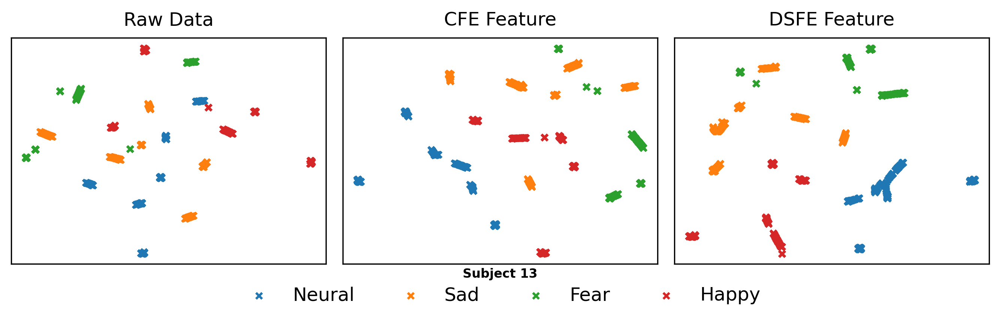

In [141]:
def plot_tsne_embeddings(data_list, label, titles):
    # 创建1x3子图画布
    fig, axes = plt.subplots(1, 3, figsize=(9, 3), dpi=300)  # 增加画布高度
    markers = ['x', 'x', 'x', 'x']
    labels = ['Neural', 'Sad', 'Fear', 'Happy']
    handles = []

    # 遍历子图绘制数据
    for ax, data, title in zip(axes, data_list, titles):
        # 数据归一化
        x_min, x_max = np.min(data, 0), np.max(data, 0)
        data = (data - x_min) / (x_max - x_min)

        # 绘制四类样本
        class_0 = data[label == 0]
        class_1 = data[label == 1]
        class_2 = data[label == 2]
        class_3 = data[label == 3]

        p1 = ax.scatter(class_0[:, 0], class_0[:, 1], marker=markers[0], s=15, color='tab:blue')
        p2 = ax.scatter(class_1[:, 0], class_1[:, 1], marker=markers[1], s=15, color='tab:orange')
        p3 = ax.scatter(class_2[:, 0], class_2[:, 1], marker=markers[2], s=15, color='tab:green')
        p4 = ax.scatter(class_3[:, 0], class_3[:, 1], marker=markers[3], s=15, color='tab:red')

        ax.set_title(title, fontsize=12, pad=8)  # 增加子图标题与图的间距
        ax.set_xticks([])
        ax.set_yticks([])

    # 收集句柄
    handles = [p1, p2, p3, p4]

    # 添加共用图例
    fig.legend(
        handles=handles,
        labels=labels,
        loc='lower center',
        bbox_to_anchor=(0.5, 0.03),  # 调整图例位置
        ncol=4,
        fontsize=12,
        frameon=False
    )

    # 添加共用标题（位于子图和图例之间）
    fig.text(
        x=0.5, y=0.17,  # 调整标题垂直位置
        s='Subject 13',  # 标题文本
        ha='center',  # 水平居中
        va='center',
        fontsize=8,
        weight='bold'
    )

    # 调整布局边距
    plt.tight_layout()
    fig.subplots_adjust(bottom=0.2)  # 为标题和图例腾出空间
    return fig

# 调用函数
data_list = [reslut, CFE_feature_tsne, DSFE_feature_tsne]
titles = ['Raw Data', 'CFE Feature', 'DSFE Feature']
fig = plot_tsne_embeddings(data_list, label_all, titles)

# 保存图像
plt.savefig(f'./tsne/s13_tsne1.svg', dpi=300, bbox_inches='tight')
plt.savefig(f'./tsne/s13_tsne1.pdf', dpi=300, bbox_inches='tight')